<a href="https://colab.research.google.com/github/rohitrnath/CNN_withMNIST_EIP4/blob/master/Sample-Notebooks/TransferLearn400kImages.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Craving For Tesla P100

In [1]:
!nvidia-smi
# !pkill -9 -f ipykernel_launcher

Mon May 25 17:28:57 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
from tensorflow import summary

In [0]:
%load_ext tensorboard
# %tensorboard --logdir /content/gdrive/My Drive/A15/I56/A15/I56/tensorboard
%tensorboard --logdir /content/gdrive/My\ Drive/test1/tensorboard/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 3676), started 0:00:24 ago. (Use '!kill 3676' to kill it.)

<IPython.core.display.Javascript object>

## Download Dataset

In [3]:
!git clone https://github.com/rohitrnath/Monocular-Depth-Estimation-and-Segmentation.git

Cloning into 'Monocular-Depth-Estimation-and-Segmentation'...
remote: Enumerating objects: 115, done.
remote: Counting objects: 100% (115/115), done.
remote: Compressing objects: 100% (85/85), done.
remote: Total 115 (delta 38), reused 93 (delta 28), pack-reused 0
Receiving objects: 100% (115/115), 11.57 MiB | 11.71 MiB/s, done.
Resolving deltas: 100% (38/38), done.


In [6]:
!cp -r /content/gdrive/My\ Drive/Assignment15/A/Output/Dataset.zip  /content/Monocular-Depth-Estimation-and-Segmentation/


cp: error reading '/content/gdrive/My Drive/Assignment15/A/Output/Dataset.zip': Input/output error


In [5]:
%cd Monocular-Depth-Estimation-and-Segmentation
! unzip -q Dataset.zip -d Dataset
!rm -r Dataset.zip

/content/Monocular-Depth-Estimation-and-Segmentation
[Dataset.zip]
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of Dataset.zip or
        Dataset.zip.zip, and cannot find Dataset.zip.ZIP, period.


In [0]:
%cd Monocular-Depth-Estimation-and-Segmentation

/content/Monocular-Depth-Estimation-and-Segmentation


In [0]:
from model.MDEASModel import *
import torch
from torchsummary import summary

use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
model = MDEASModel().to(device)
summary(model, [(3, 224, 224), (3, 224, 224)])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 224, 224]             864
       BatchNorm2d-2         [-1, 32, 224, 224]              64
              ReLU-3         [-1, 32, 224, 224]               0
            Conv2d-4         [-1, 32, 112, 112]           9,216
       BatchNorm2d-5         [-1, 32, 112, 112]              64
              ReLU-6         [-1, 32, 112, 112]               0
            Conv2d-7         [-1, 32, 224, 224]             864
       BatchNorm2d-8         [-1, 32, 224, 224]              64
              ReLU-9         [-1, 32, 224, 224]               0
           Conv2d-10         [-1, 32, 112, 112]           9,216
      BatchNorm2d-11         [-1, 32, 112, 112]              64
             ReLU-12         [-1, 32, 112, 112]               0
           Conv2d-13         [-1, 64, 112, 112]             640
           Conv2d-14         [-1, 64, 1

In [0]:
%reload_ext autoreload
%matplotlib inline
%cd Monocular-Depth-Estimation-and-Segmentation

!python train.py --resume /content/best-depth-model.pth --logdir /content/gdrive/My\ Drive/summary --batch-size 40 --test-batch-size 40 --epochs 10 --warmup 0 --edge_len 3 --cycles 2 --lr_min=0.00005 --lr_max 0.005 

/content/Monocular-Depth-Estimation-and-Segmentation
Namespace(base_size=224, batch_size=40, crop_size=224, cycles=2, dataset='Dataset/label_data.csv', debug=False, device=device(type='cuda'), edge_len=3, epochs=10, eval_limit=-1, logdir='/content/gdrive/My Drive/summary', lr=0.001, lr_max=0.005, lr_min=5e-05, net_graph=False, no_val=False, ratio=0.7, resume='/content/best-depth-model.pth', seed=1, start_epoch=0, test_batch_size=40, warmup=0, workers=4)
2020-05-25 10:52:02.893845: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
resume training with  /content/best-depth-model.pth
Starting Epoch: 0
Total Epoches: 10
Training starts at 2020-05-25 10:52:08.930430 
[0][0/7000] loss=0.18351954221725464 mask_ssim=0.03022998571395874 depth_ssim=0.08116334676742554 mask_l1=0.006308369338512421 depth_l1=0.05392047390341759 mask_mse=0.0027306361589580774 depth_mse=0.006694325245916843 Acc-mask=0.9697700142860413  Acc-depth=0.91

## Utils

In [0]:
from model.MDEASModel import *
from Logger.SummaryTracker import *

import torchvision.utils as vutils    
from torch.utils.tensorboard import SummaryWriter
import torch
from torchsummary import summary

use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
model = MDEASModel()
#model.apply(weights_init)

print('Model created.')
PATH = '/content/'
_writer = SummaryTracker( PATH)
#_writer.addGraph(model,16)

model = model.to(device)

if device == 'cuda':
    print('cuda')
    model = torch.nn.DataParallel(model)
    cudnn.benchmark = True

model.load_state_dict(torch.load('/content/best-depth-model.pth'))



Model created.


<All keys matched successfully>

In [0]:
from dataloader.dataloader import GetTrainTestData
m_train_loader, m_test_loader = GetTrainTestData( 'Dataset/label_data.csv', 0.7, trainBS=50, testBS=50, DEBUG=True)

Output  0


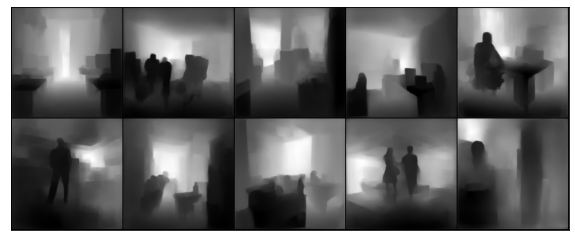

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


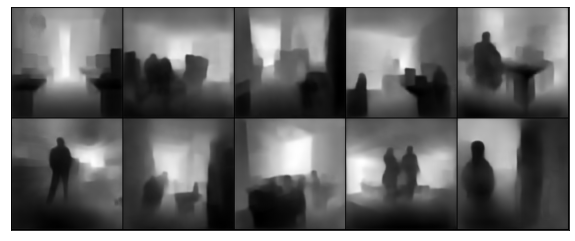

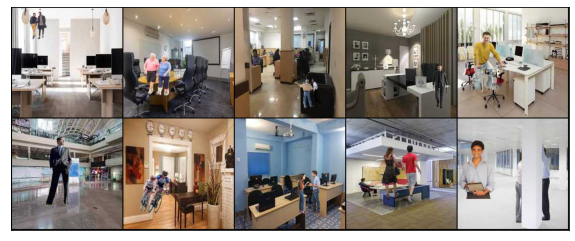

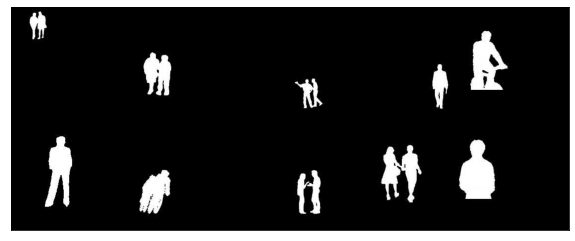

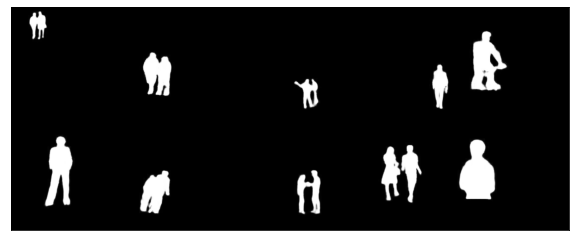

Output  1


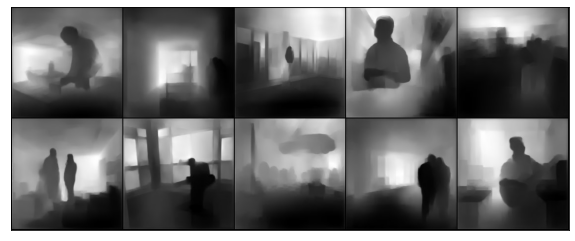

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


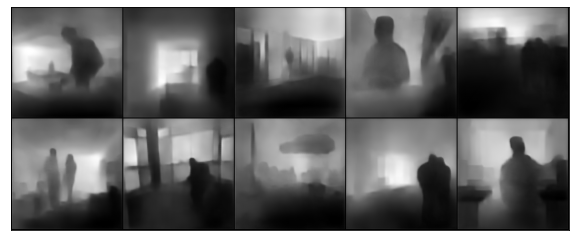

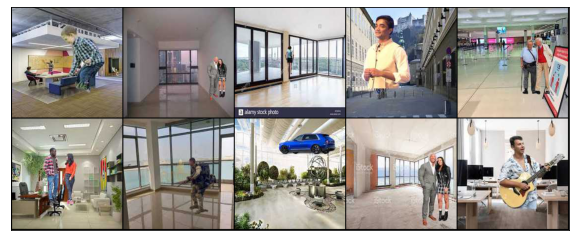

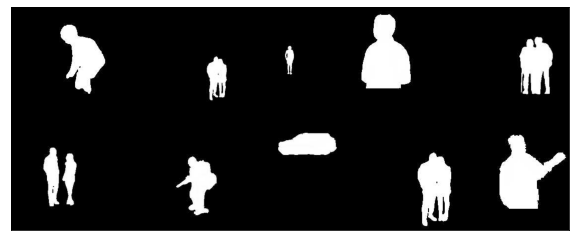

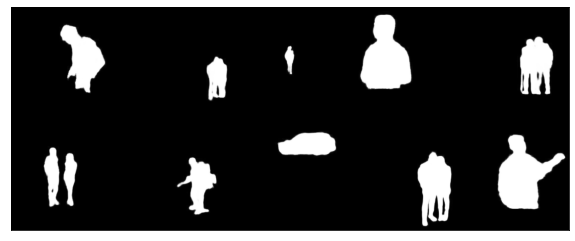

Output  2


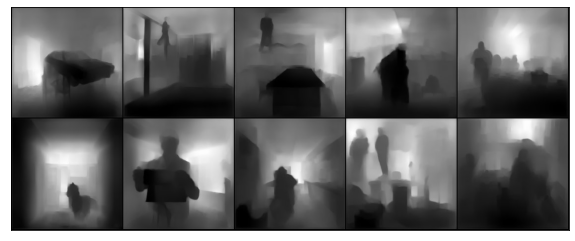

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


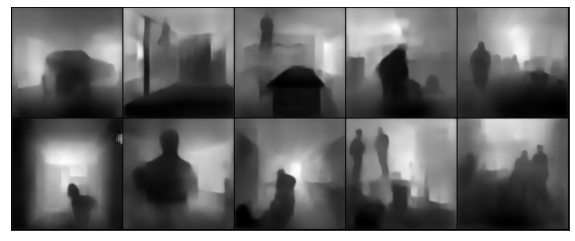

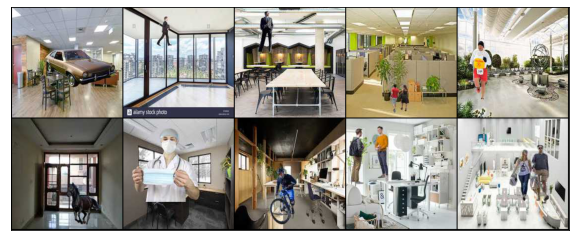

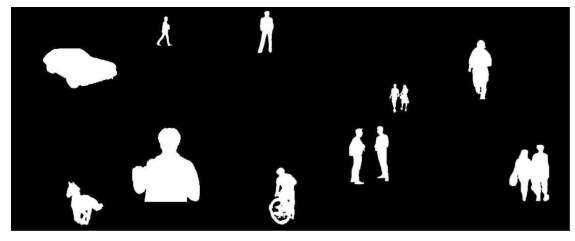

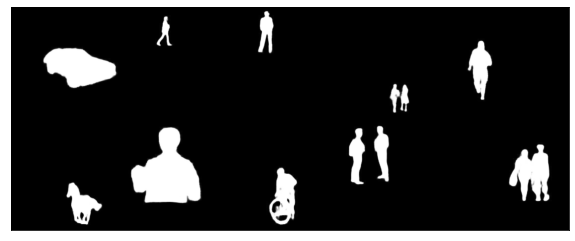

Output  3


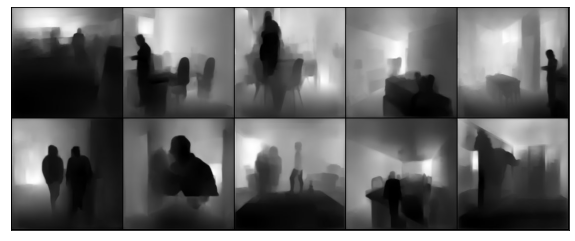

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


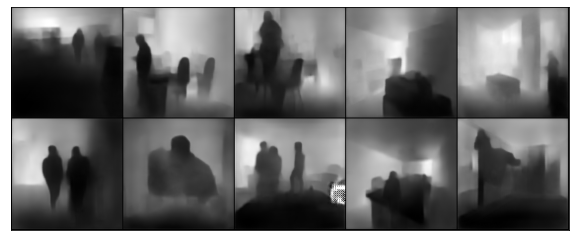

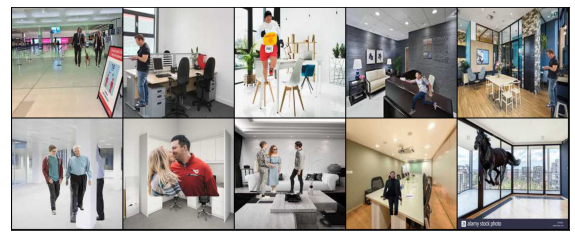

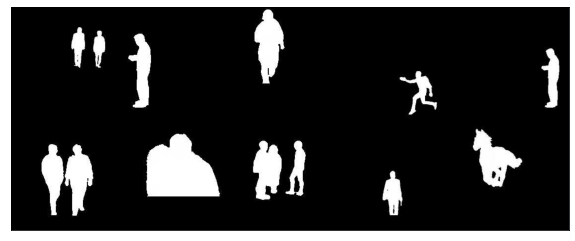

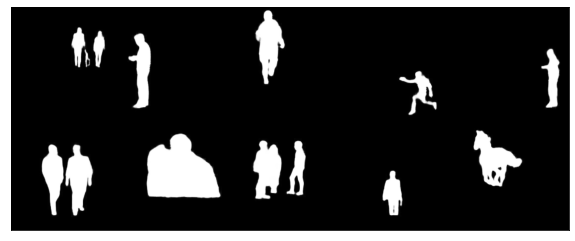

Output  4


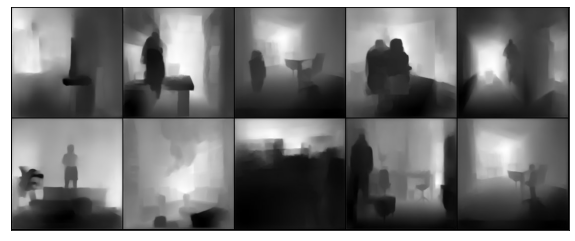

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


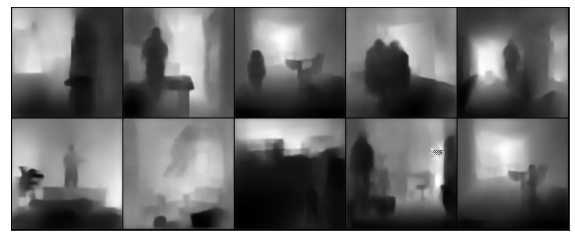

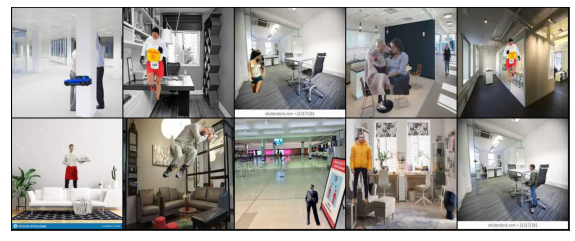

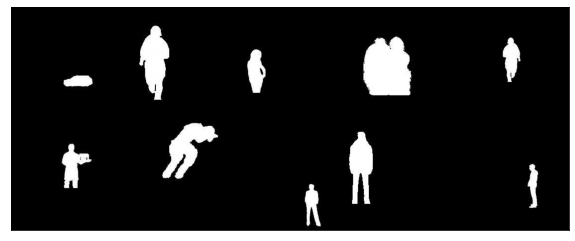

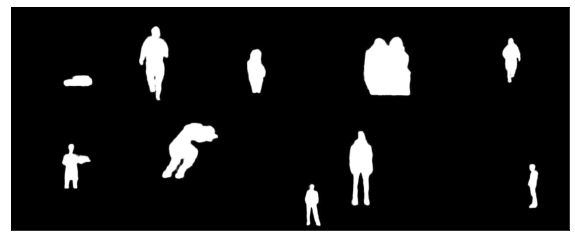

Output  5


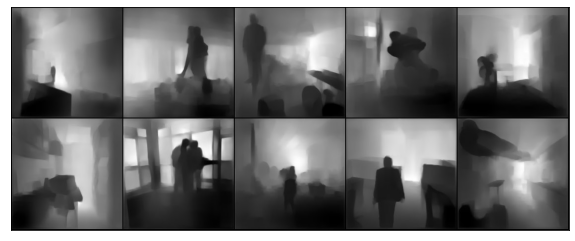

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


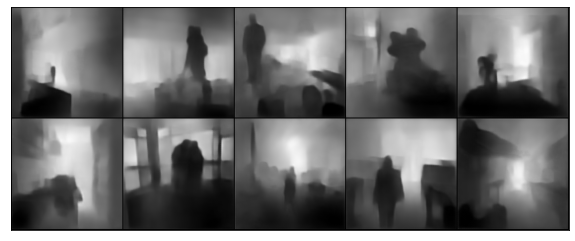

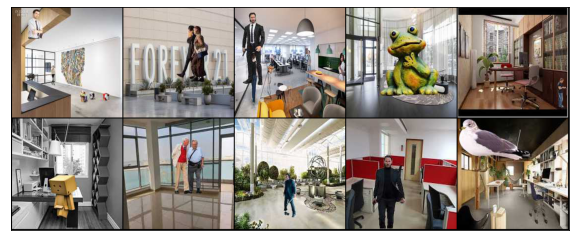

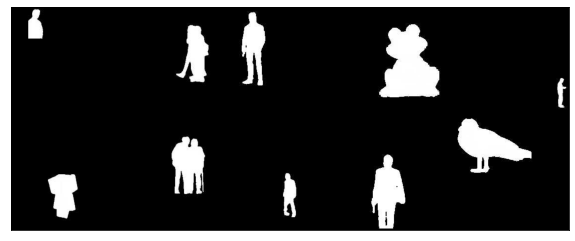

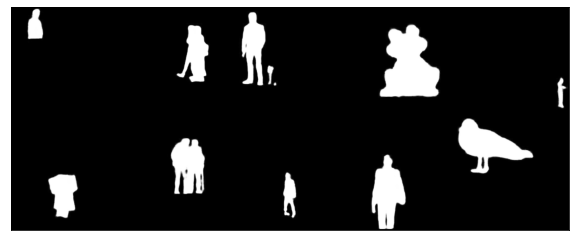

Output  6


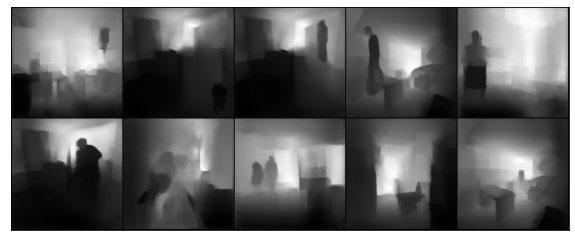

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


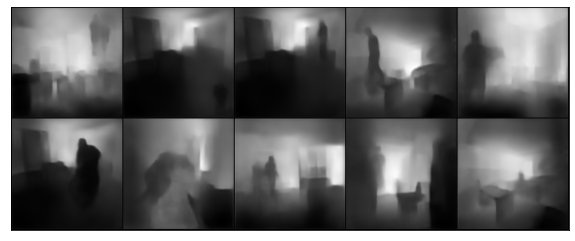

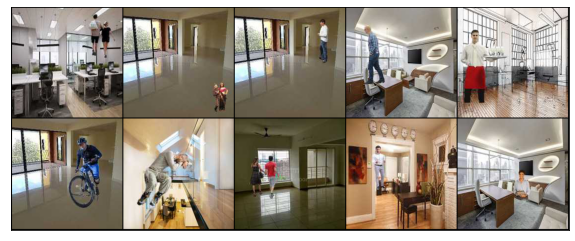

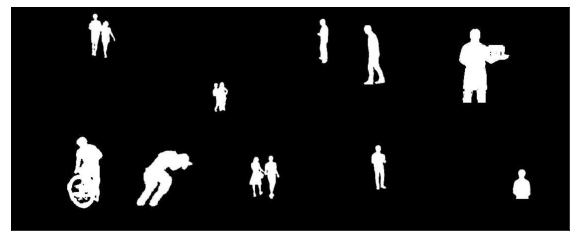

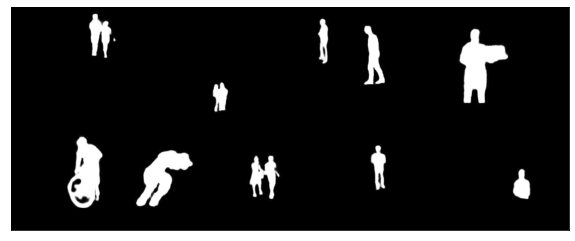

Output  7


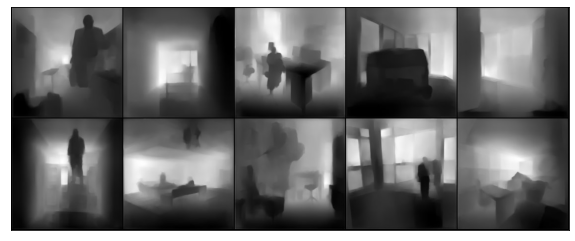

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


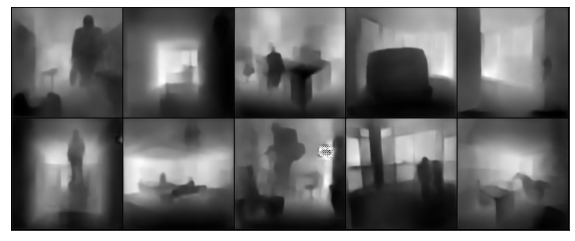

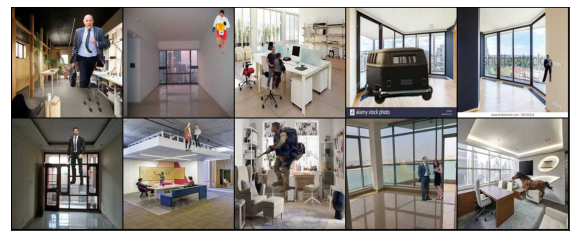

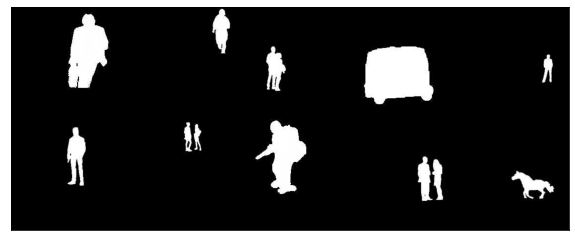

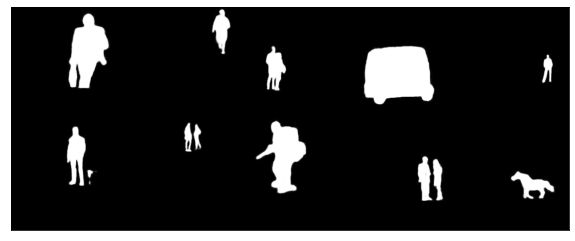

Output  8


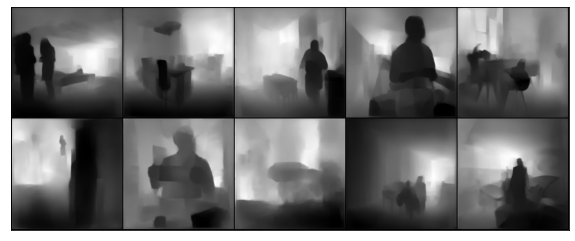

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


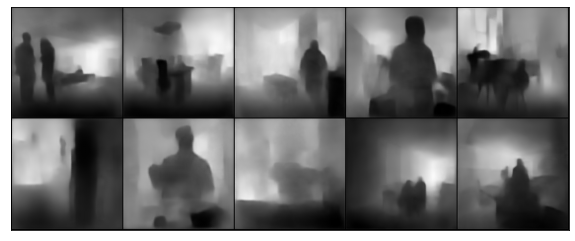

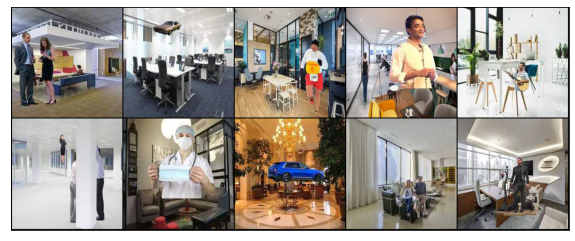

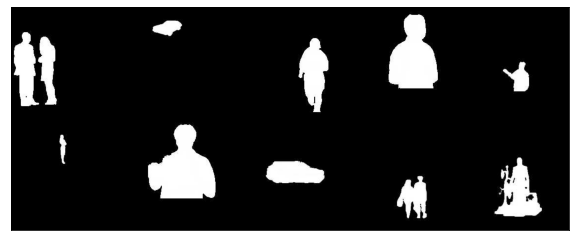

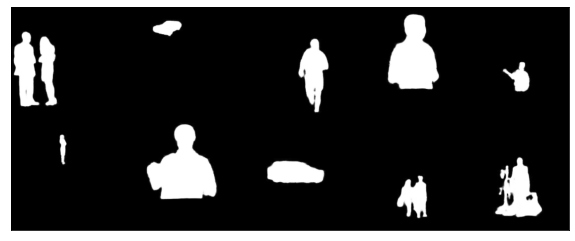

Output  9


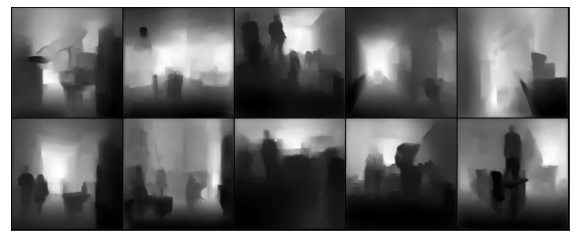

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


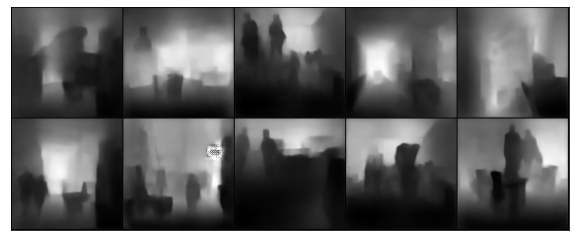

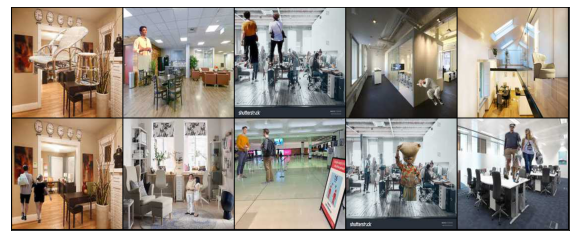

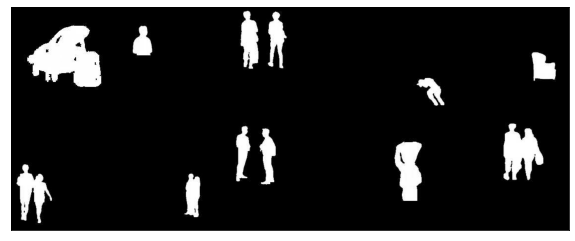

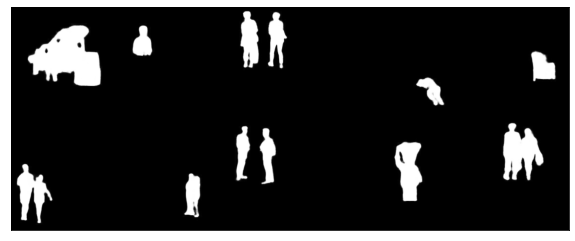

Output  10


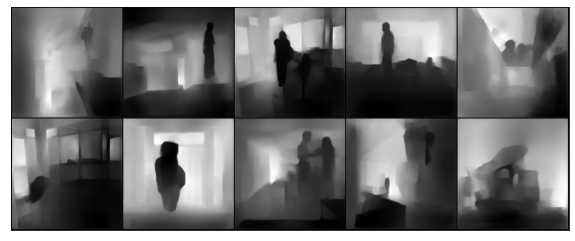

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


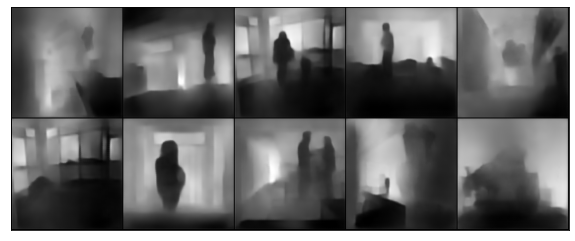

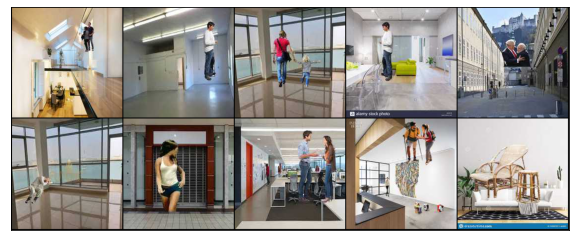

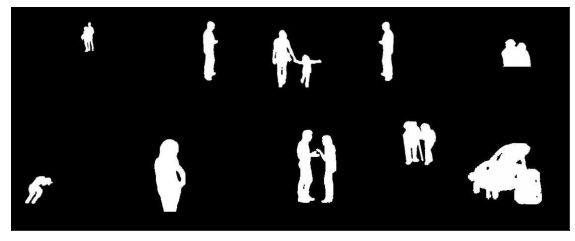

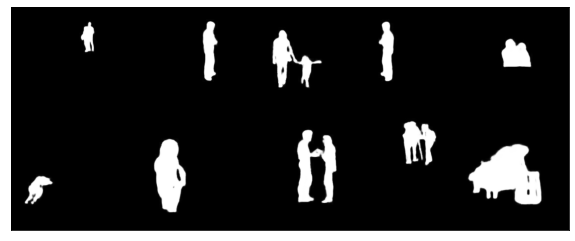

Output  11


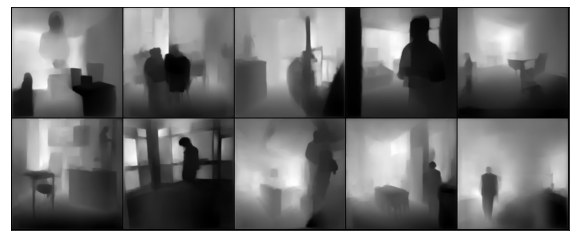

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


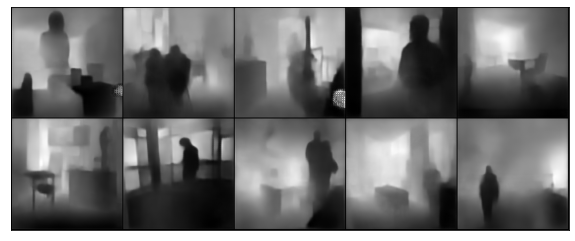

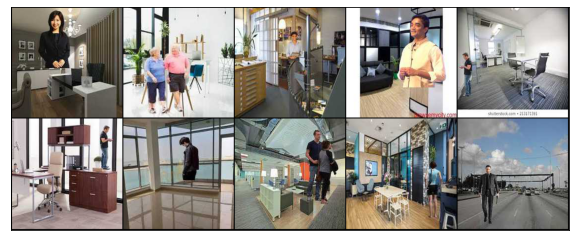

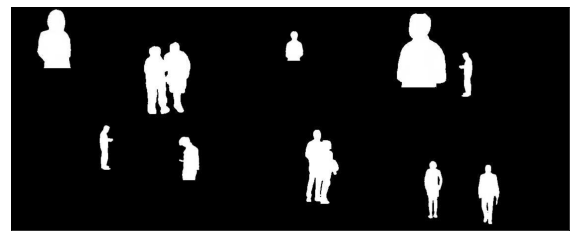

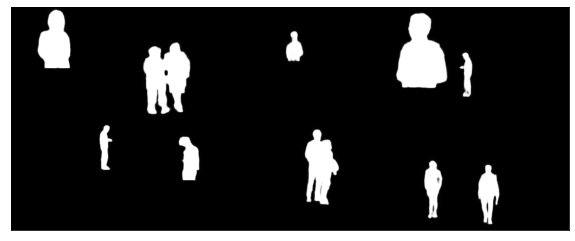

Output  12


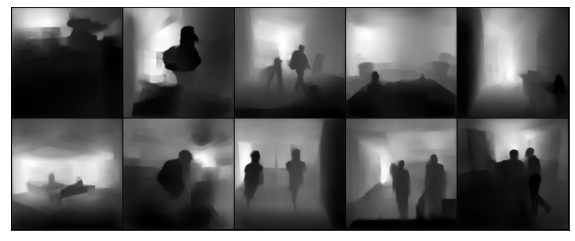

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


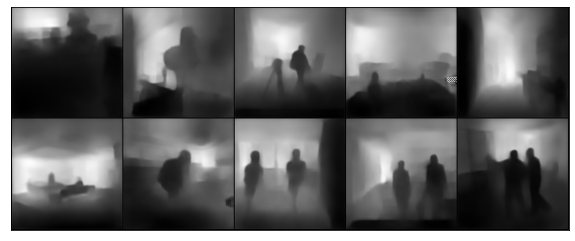

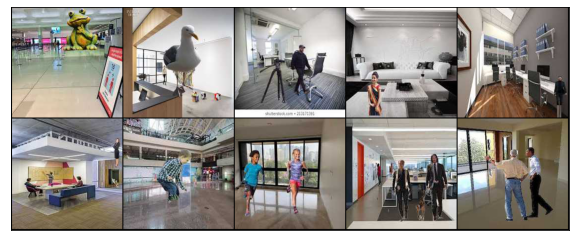

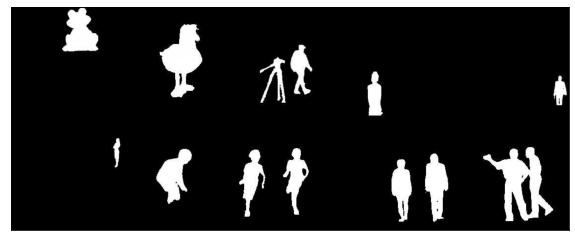

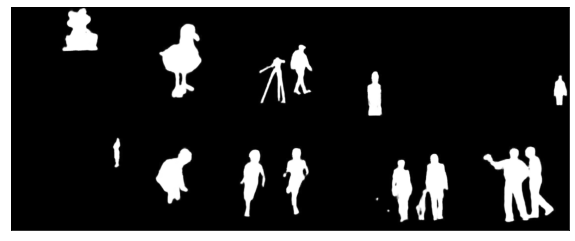

Output  13


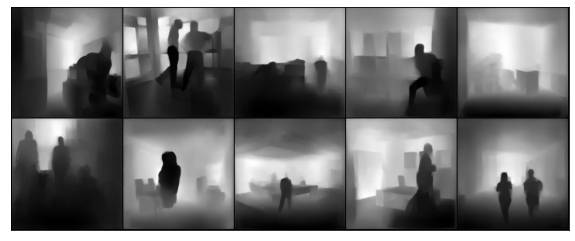

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


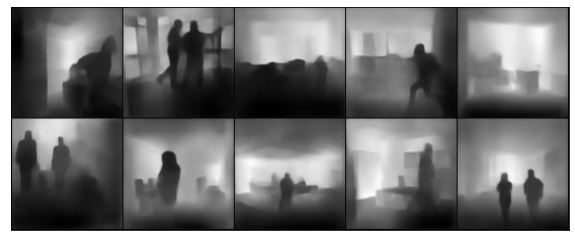

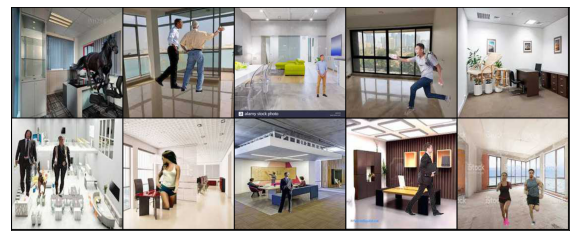

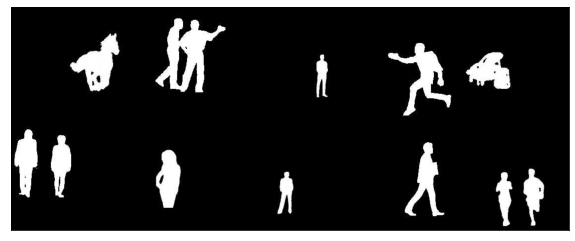

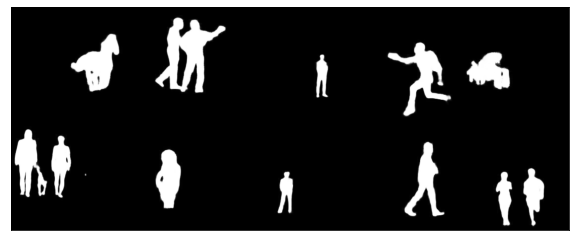

Output  14


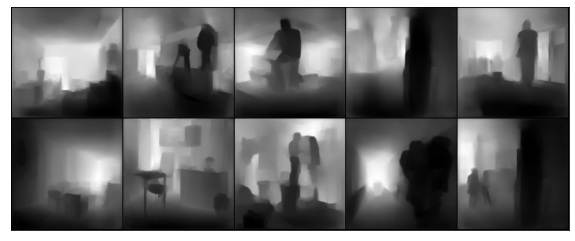

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


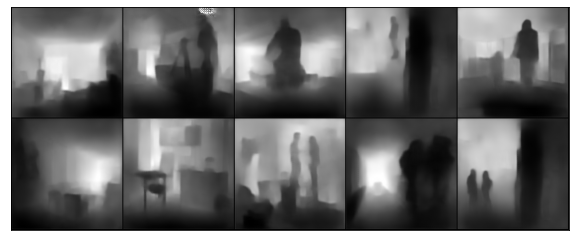

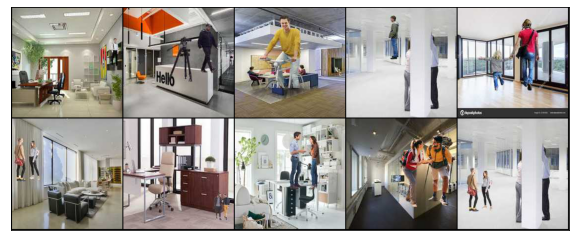

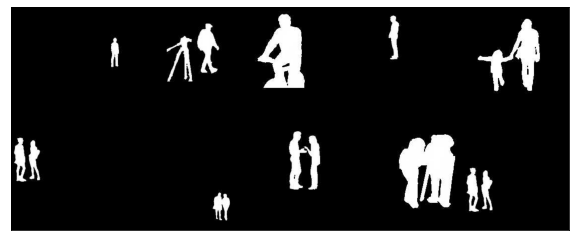

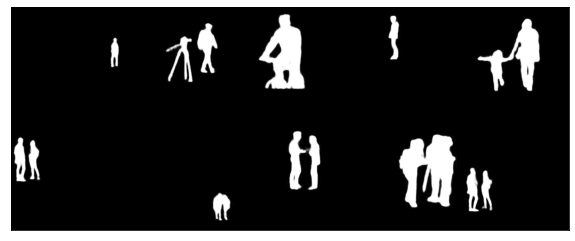

Output  15


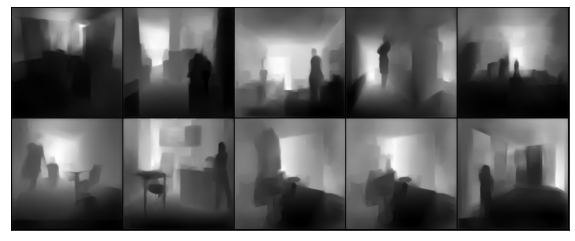

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


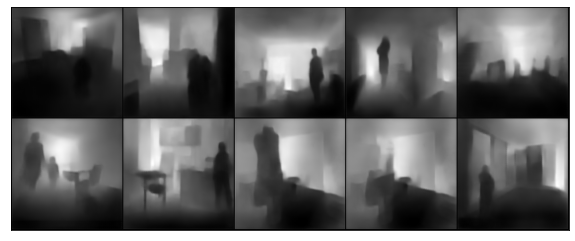

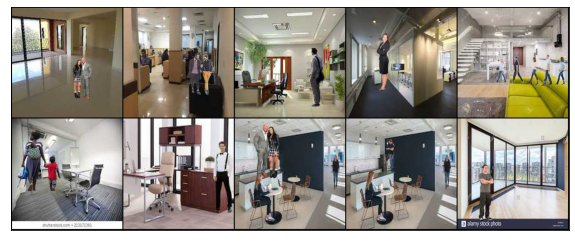

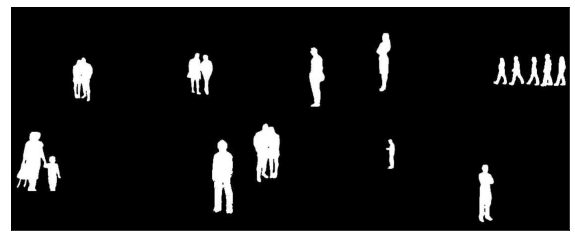

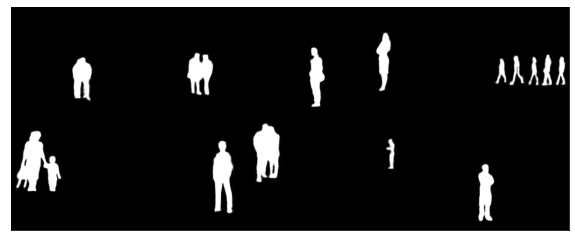

Output  16


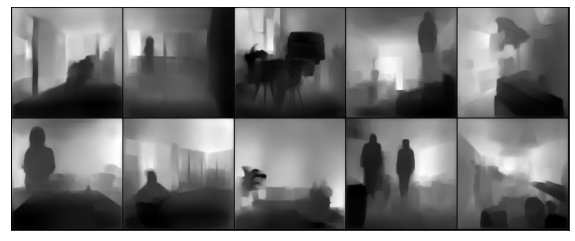

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


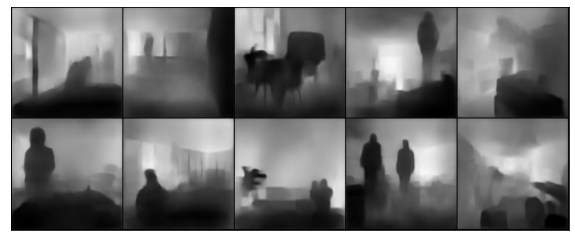

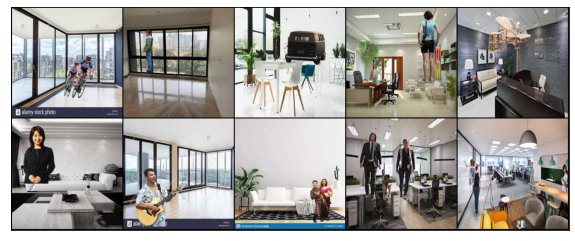

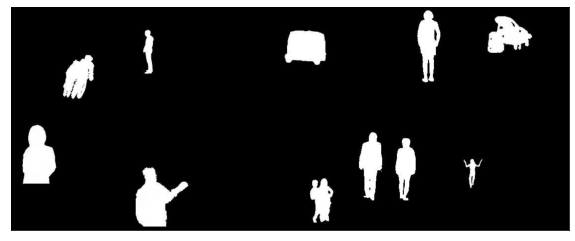

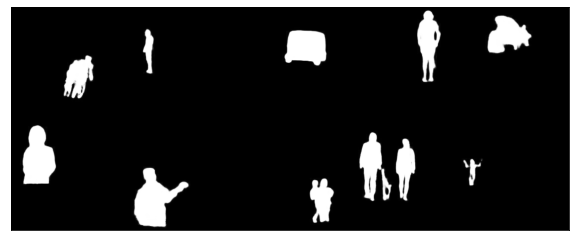

Output  17


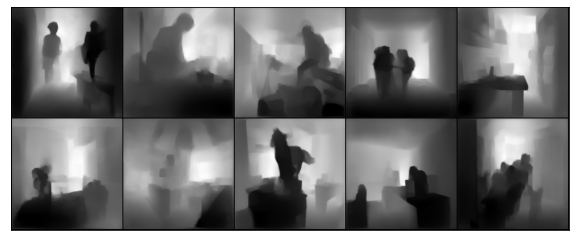

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


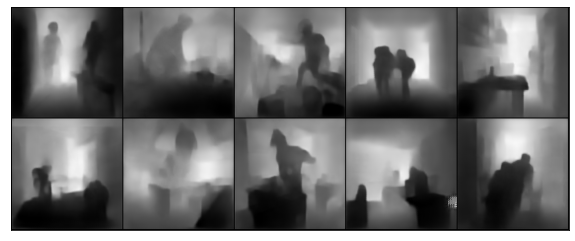

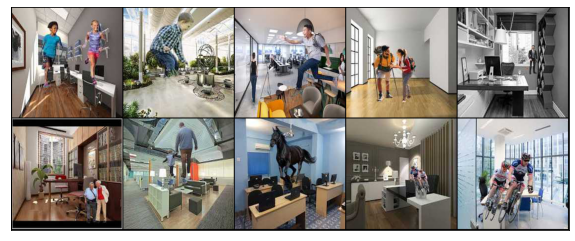

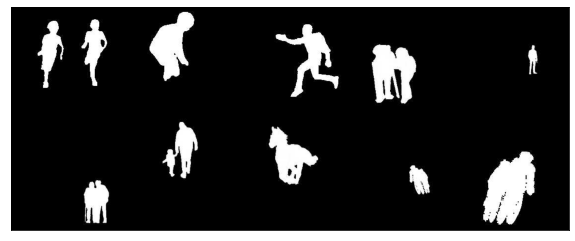

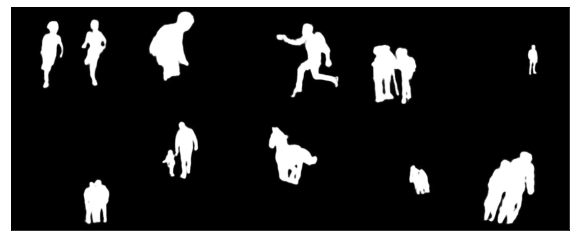

Output  18


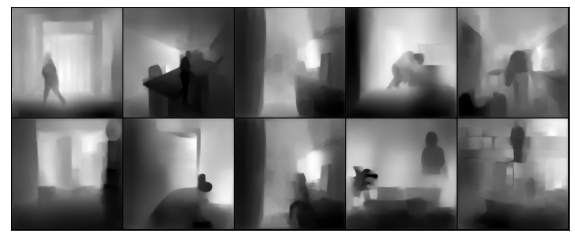

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


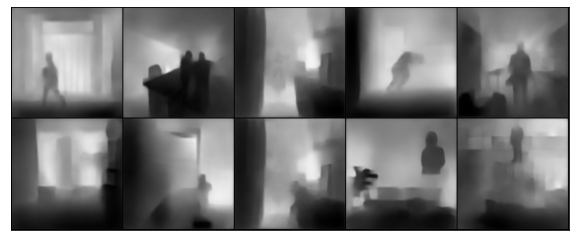

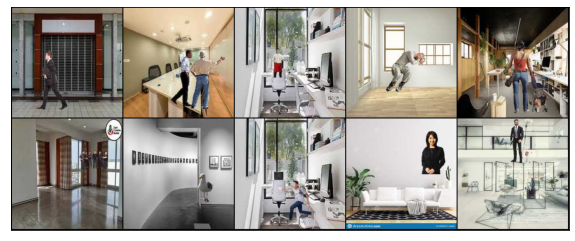

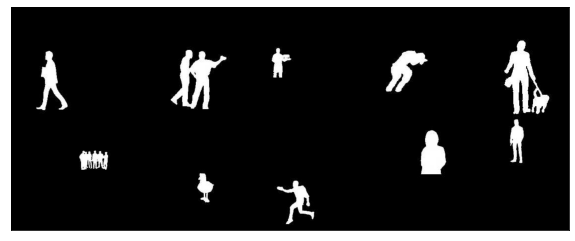

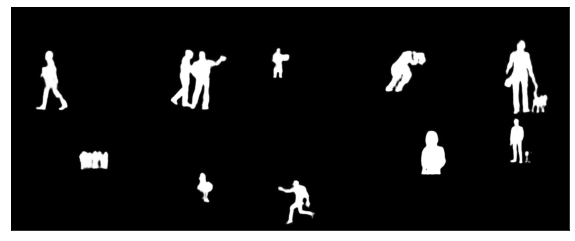

Output  19


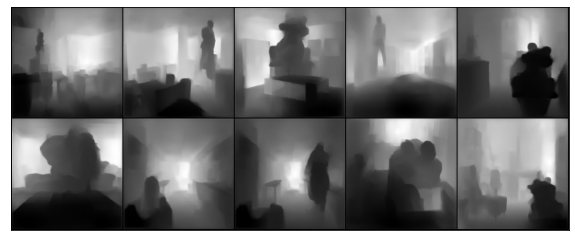

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


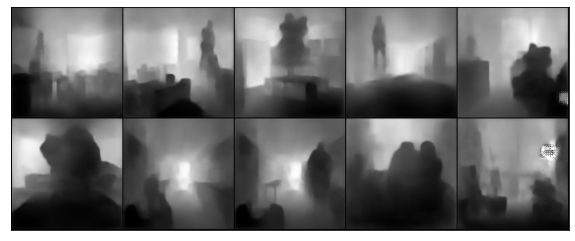

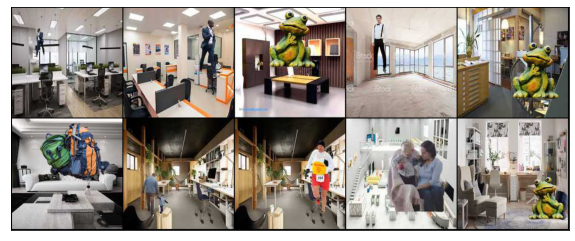

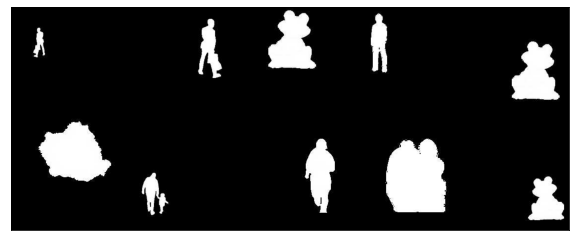

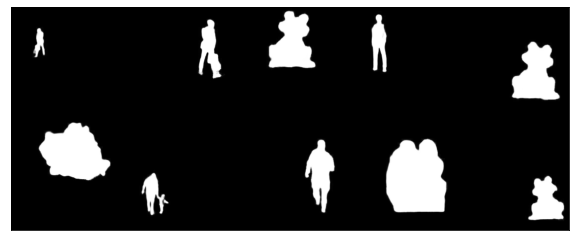

Output  20


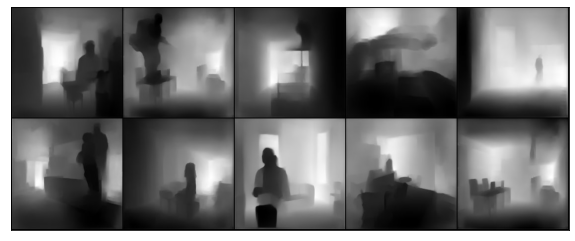

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


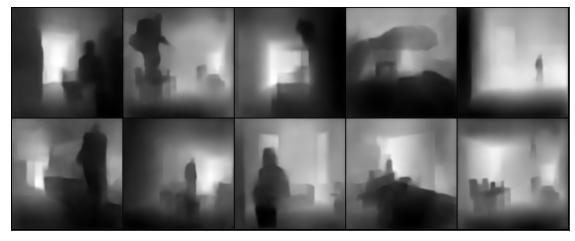

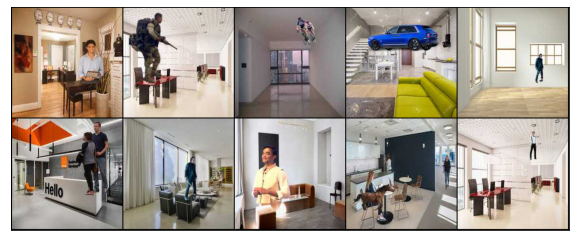

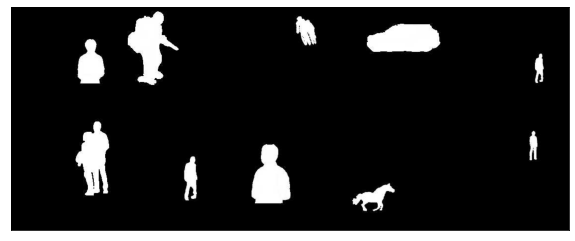

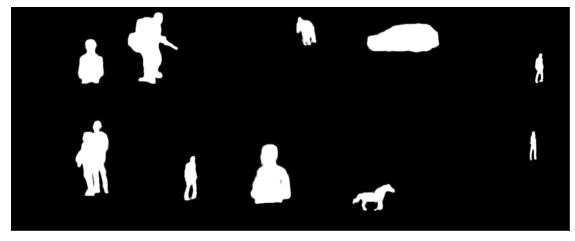

Output  21


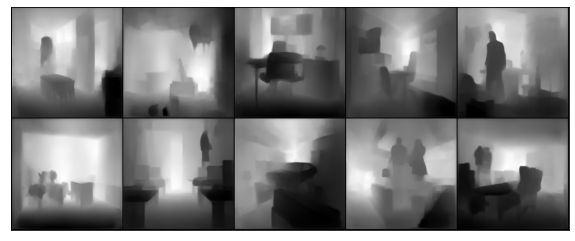

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


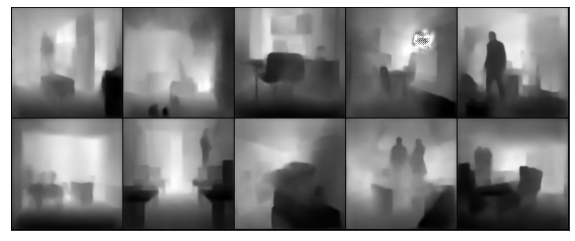

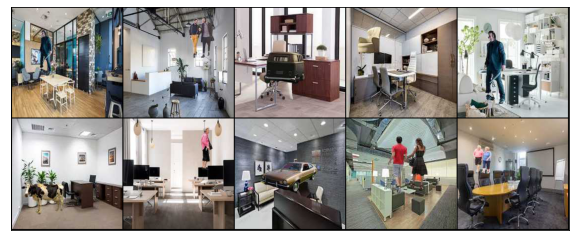

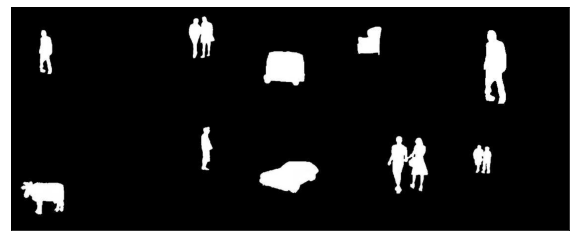

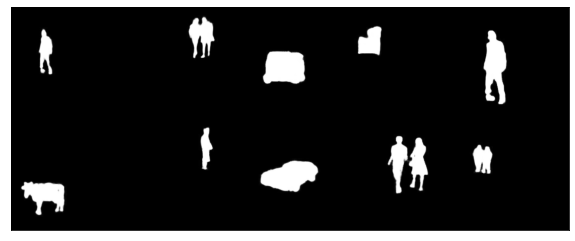

In [0]:
from Logger.GridImage import show
def test(model, device, test_loader):
  model.eval()
  with torch.no_grad():
    for i, sample_batch in enumerate(test_loader):
      bg_n    = sample_batch['bg'].to(device)
      fg_bg_n = sample_batch['fg_bg'].to(device)
      mask_n  = sample_batch['mask'].to(device)
      depth_n = sample_batch['depth'].to(device)
      
      output = model(bg_n,fg_bg_n)
      print("Output ", i)
      show(sample_batch['depth'].cpu(), nrow=5)
      show(output[0].detach().cpu(), nrow=5)
      show(sample_batch['fg_bg'].cpu(), nrow=5)
      show(sample_batch['mask'].cpu(), nrow=5)
      show(output[1].detach().cpu(), nrow=5)
      if i > 20:
        break


test(model, device, m_test_loader)

## Let's Do Transfer Learn To Entire 400K Images

In [0]:
!zip -r netGraph.zip /content/tensorboard

  adding: content/tensorboard/ (stored 0%)
  adding: content/tensorboard/events.out.tfevents.1590403151.ba6a9cde8070.1077.1 (deflated 96%)
  adding: content/tensorboard/events.out.tfevents.1590403151.ba6a9cde8070.1077.0 (deflated 5%)
